# 微博热搜分析

In [73]:
import pandas as pd
import numpy as np
import seaborn as sns
import pylab as plt

plt.rcParams['font.sans-serif'] = ['Microsoft YaHei']  # 用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False  # 用来正常显示负号, 注意['SimHei']对应这句不行.

In [2]:
df = pd.read_excel('./data/微博热搜数据2020.xlsx')

In [3]:
df.head()

,Unnamed: 0,date,title,searchCount,rank,words_list
0,0,2020/01/01,快本为何炅改播出时间,9257913,1,"['快本', '为何', '炅', '改', '播出', '时间']"
1,1,2020/01/01,唐一菲,4993064,2,['唐一菲']
2,2,2020/01/01,橘子洲烟花,4712996,3,"['橘子', '子洲', '橘子洲', '烟花']"
3,3,2020/01/01,吴亦凡脖子,4426161,4,"['吴亦凡', '脖子']"
4,4,2020/01/01,吴昕状态,4209201,5,"['吴昕', '状态']"


In [4]:
len(df)

35900

## 中文分词

In [5]:
import jieba

In [32]:
list(jieba.cut(df['title'][0], cut_all=False))

['快本', '为何', '炅', '改', '播出', '时间']

In [19]:
!pip install thulac

     |████████████████████████████████| 52.9 MB 1.4 MB/s eta 0:00:012
  Created wheel for thulac: filename=thulac-0.2.1-py3-none-any.whl size=53141672 sha256=4cabf5d0d053e4cc0949e50754fc81dd3a4de744e20e64cbb7549541f9da1b99
  Stored in directory: /Users/datalab/Library/Caches/pip/wheels/97/37/f3/be4ae10faf0fbf35cc192469b737ead6f8f99404bcd82fb2e0
Successfully built thulac


In [25]:
import thulac

thu1 = thulac.thulac()  #默认模式
text = thu1.cut("快本为何炅改播出时间", text=True)  #进行一句话分词
print(text)

Model loaded succeed
快本_d 为_v 何炅_r 改播_v 出_v 时间_n


In [28]:
text = thu1.cut("快本为何炅改播出时间", text=False)  #进行一句话分词
print(text)

[['快本', 'd'], ['为', 'v'], ['何炅', 'r'], ['改播', 'v'], ['出', 'v'], ['时间', 'n']]


In [29]:
text = thu1.cut("橘子洲烟花", text=False)  #进行一句话分词
print(text)

[['橘子洲', 'ns'], ['烟花', 'n']]


In [30]:
text = thu1.cut("吴亦凡脖子", text=False)  #进行一句话分词
print(text)

[['吴亦凡', 'np'], ['脖子', 'n']]


In [31]:
text = thu1.cut("吴昕状态", text=False)  #进行一句话分词
print(text)

[['吴昕', 'np'], ['状态', 'n']]


n/名词 np/人名 ns/地名 ni/机构名 nz/其它专名
m/数词 q/量词 mq/数量词 t/时间词 f/方位词 s/处所词
v/动词 a/形容词 d/副词 h/前接成分 k/后接成分 
i/习语 j/简称 r/代词 c/连词 p/介词 u/助词 y/语气助词
e/叹词 o/拟声词 g/语素 w/标点 x/其它 

In [36]:
def cut_words(txt):
    text = thu1.cut(txt, text=False) 
    text = [i for i,j in text]
    return text

# flush print
import sys
def flushPrint(d):
    sys.stdout.write('\r')
    sys.stdout.write(str(d))
    sys.stdout.flush()

In [35]:
cut_words('快本为何炅改播出时间')

['快本', '为', '何炅', '改播', '出', '时间']

In [37]:
wlist = []
for k, i in enumerate(df['title']):
    if k % 100 ==0:
        flushPrint(k)
    text = cut_words(i)
    wlist.append(text)

35800

In [38]:
df['wlist'] = wlist

In [40]:
df = df.drop('Unnamed: 0', axis=1,)  

In [41]:
df

,date,title,searchCount,rank,words_list,wlist
0,2020/01/01,快本为何炅改播出时间,9257913,1,"['快本', '为何', '炅', '改', '播出', '时间']","[快本, 为, 何炅, 改播, 出, 时间]"
1,2020/01/01,唐一菲,4993064,2,['唐一菲'],[唐一菲]
2,2020/01/01,橘子洲烟花,4712996,3,"['橘子', '子洲', '橘子洲', '烟花']","[橘子洲, 烟花]"
3,2020/01/01,吴亦凡脖子,4426161,4,"['吴亦凡', '脖子']","[吴亦凡, 脖子]"
4,2020/01/01,吴昕状态,4209201,5,"['吴昕', '状态']","[吴昕, 状态]"
...,...,...,...,...,...,...
35895,2020/12/30,如何看待大小周工作制,1108684,96,"['如何', '看待', '大小', '周', '工作', '工作制']","[如何, 看待, 大小, 周工作制]"
35896,2020/12/30,以色列两老人接种美产疫苗后死亡,1085368,97,"['以色列', '两', '老人', '接种', '美产', '疫苗', '后', '死亡']","[以色列, 两, 老人, 接种, 美产, 疫苗, 后, 死亡]"
35897,2020/12/30,沈阳全面进入战时状态,1082178,98,"['沈阳', '全面', '进入', '战时', '状态']","[沈阳, 全面, 进入, 战时, 状态]"
35898,2020/12/30,人社局介入员工连上2次厕所被罚款,1077144,99,"['人', '社局', '介入', '员工', '连上', '2', '次', '厕所', ...","[人社局, 介入, 员工, 连, 上, 2, 次, 厕所, 被, 罚款]"


In [43]:
df.to_excel('./data/微博热搜数据2020.xlsx', index = False)

In [48]:
print(*df['title'][:100])

快本为何炅改播出时间 唐一菲 橘子洲烟花 吴亦凡脖子 吴昕状态 郑爽回归微博 祝你新年王老吉 2020新年快乐 5G视频手机Reno3 王源被舞台烟花溅到眼睛 贺军翔方否认出轨 跨年收视率 42万游客上海外滩跨年 小米年货节 2020有5个神奇的星期六 香港17名反对派区议员涉暴被捕 2020together 湖南卫视乱切镜头的原因 贺军翔 北京妇产医院首个20后宝宝 小黑瓶新年限定 刘昊然解密极味馆 敢于真实 做时间的朋友 谢娜的主持 李现被机器人表白 新的十年 敢于向前 郭富城听野狼disco是什么感受 2020一起安慕希 马航一航班从大兴机场起飞后返航 我的新年第一支视频 bilibili晚会 马航回应MH319起飞后返航 YSL夜皇后精华 聚划算百亿补贴 所有闺蜜都结婚了 重庆被砸女生家属获政府20万补偿 Bella发文与高以翔告别 下一个十年会怎样 鹿晗 我就是胖着玩 假唱 宠爱暖哭了 和李现滑雪 趋势大赏 庆余年大结局 何雯娜产女 娜扎 2020年一起富哈 郑爽律师致信鲸乖乖公司 重庆被跳楼者砸死女生已安葬 赵丽颖在线发糖 开启更好2020 李宇春表演途中擦掉口红 再见2019干杯2020 iPad茅台9块9抢 学生期末将微信名改成教务处 跨年 歌手首发阵容 杨幂的RAP 感恩2019你好2020 90后超六成压力来自房和车 新年第一场升旗 吴宗宪唱到一半陌生男骑车冲上台 男粉偷亲黄子韬 日产前CEO藏乐器盒中逃离日本 宠爱票房 重庆加州花园 紧急救援预告 易烊千玺太A了 倪妮 有1说1表情包 央行决定降准0.5个百分点 关晓彤演技 杨紫30秒不眨眼 丹顶鹤冰面上滑倒淡定起身 刘涛的跨年瞬间 央视主持天团的2019 首批九零后30了 何运晨李浩源邓冰莹拿到offer 新疆和田西瓜烤肉 佳木斯东郊机场火灾 宠爱彩蛋 外国领导人发表新年贺词 王一博水中唱跳 水豚泡温泉头顶橘子一动不动 小黑瓶开启好肤质 2020年首场流星雨 华南海鲜批发市场休市整治卫生 跨年文案 看过最油腻的霸道总裁 重庆解放碑跨年 2020拼假日历 林郑月娥慰问香港警队 浙江卫视跨年节目单 死者家属不认同丽江反杀案撤诉 北京时间相约北京跨年 2020图片 迪丽热巴 唱跳 杜富国熟练使用平板电脑与战友视频 支付宝红包 D社 金莎为粉丝建脱单助攻群 公司年终奖发200万湖景房


In [50]:
df[100:]

,date,title,searchCount,rank,words_list,wlist
100,2020/01/02,张翰微博评论,5333810,1,"['张翰', '微博', '评论']","[张翰微博, 评论]"
101,2020/01/02,李天一,4633015,2,"['李', '天一']",[李天一]
102,2020/01/02,王菲李亚鹏周迅窦靖童参加新年派对,4256117,3,"['王菲', '李亚鹏', '周迅', '窦靖童', '参加', '新年', '派对']","[王菲, 李亚鹏, 周迅, 窦靖童, 参加, 新年, 派, 对]"
103,2020/01/02,关晓彤穿鹿晗的卫衣,3819525,4,"['关晓彤', '穿', '鹿晗', '的', '卫衣']","[关晓彤, 穿, 鹿晗, 的, 卫衣]"
104,2020/01/02,杜江 努力是最不值得一提的事,3800499,5,"['杜江', ' ', '努力', '是', '最', '不', '值得', '值得一提',...","[杜江, , 努力, 是, 最, 不, 值得一提, 的, 事]"
...,...,...,...,...,...,...
35895,2020/12/30,如何看待大小周工作制,1108684,96,"['如何', '看待', '大小', '周', '工作', '工作制']","[如何, 看待, 大小, 周工作制]"
35896,2020/12/30,以色列两老人接种美产疫苗后死亡,1085368,97,"['以色列', '两', '老人', '接种', '美产', '疫苗', '后', '死亡']","[以色列, 两, 老人, 接种, 美产, 疫苗, 后, 死亡]"
35897,2020/12/30,沈阳全面进入战时状态,1082178,98,"['沈阳', '全面', '进入', '战时', '状态']","[沈阳, 全面, 进入, 战时, 状态]"
35898,2020/12/30,人社局介入员工连上2次厕所被罚款,1077144,99,"['人', '社局', '介入', '员工', '连上', '2', '次', '厕所', ...","[人社局, 介入, 员工, 连, 上, 2, 次, 厕所, 被, 罚款]"


## 语义网络

In [59]:
def successive_list(alist):
    return [[alist[:-1][i], alist[1:][i]] for i in range(len(alist)-1)]

In [67]:
successive_list(a)

[[1, 2]]

In [98]:
import networkx as nx
import itertools

G=nx.Graph()

for slist in wlist:
    if len(slist)>1:
        slist = [i  for i in slist if len(i) > 1]
        edgelist = successive_list(slist)
        for e1, e2 in edgelist:
            G.add_edge(e1, e2)

In [99]:
nx.info(G)

'Name: \nType: Graph\nNumber of nodes: 22690\nNumber of edges: 60227\nAverage degree:   5.3087'

In [100]:
pr = nx.pagerank(G, alpha=0.9)
deg = dict(nx.degree_centrality(G))
dei = dict(nx.eigenvector_centrality(G))
dd = [(i, deg[i], dei[i], pr[i]) for i in deg]


dd = pd.DataFrame(dd, columns = ('behavior', 'Centrality','Eigenvector Centrality', 'PageRank'))
dd = dd.sort_values(by=['Centrality'], ascending = False)
dd = dd.reset_index()
dd[:20]

,index,behavior,Centrality,Eigenvector Centrality,PageRank
0,79,回应,0.036538,0.237855,0.005882
1,416,中国,0.030499,0.230003,0.004656
2,551,美国,0.020362,0.178964,0.003027
3,2857,确诊,0.018467,0.172638,0.002789
4,370,武汉,0.017850,0.161130,0.002640
5,371,疫情,0.016263,0.155644,0.002376
6,1130,口罩,0.014412,0.107177,0.002215
7,3240,冠肺炎,0.012693,0.109213,0.002071
8,1000,直播,0.012032,0.050531,0.002050
9,731,发现,0.011988,0.097391,0.001920


In [101]:
dd[20:40]

,index,behavior,Centrality,Eigenvector Centrality,PageRank
20,779,自己,0.008727,0.040532,0.001404
21,334,宣布,0.008550,0.077441,0.001280
22,1435,女孩,0.008462,0.065487,0.001317
23,1582,韩国,0.008418,0.088298,0.001261
24,2084,湖北,0.008330,0.097552,0.001191
25,703,全国,0.008242,0.071739,0.001210
26,372,要求,0.008242,0.075264,0.001227
27,254,患者,0.008066,0.080819,0.001158
28,151,日本,0.007977,0.096116,0.001173
29,47,医院,0.007933,0.090832,0.001175


In [108]:
print(*dd['behavior'][:500])

回应 中国 美国 确诊 武汉 疫情 口罩 冠肺炎 直播 发现 男子 北京 病例 病毒 学生 人员 出现 第一 感染 新增 自己 宣布 女孩 韩国 湖北 全国 要求 患者 日本 医院 医生 女子 全球 大学 女儿 2020 女生 儿子 去世 妈妈 取消 没有 10 粉丝 隔离 上海 香港 所有 姐姐 王一博 公司 死亡 拒绝 暂停 11 一个 世界 建议 老师 事件 新冠 意大利 通报 视频 20 发生 特朗普 检测 高校 生活 开学 高考 英国 微博 手机 道歉 一起 孩子 发布 禁止 护士 12 恢复 小区 现场 抗疫 父亲 总统 进入 计划 参加 可能 公布 工作 钟南山 收到 免费 演员 大学生 发声 明星 教师 伊朗 成都 结婚 全面 可以 挑战 时间 电影 员工 成功 发文 全部 医护 我们 开始 航班 学校 游客 母亲 表情 生日 承认 组织 疫苗 为什 最后 今年 新型 朋友 调查 申请 支持 再次 小时 老人 第二 起诉 男孩 我国 四川 司机 退出 郑爽 部分 市长 浙江 症状 造型 正式 接受 幼儿园 境外 毕业 广东 工作室 虞书欣 儿童 使用 关闭 山东 舞台 游戏 印度 成为 政府 公开 杨幂 分钟 复工 特朗 重庆 警方 留学生 机场 16 苹果 华为 河南 防疫 医疗 肺炎 完成 感染者 爸爸 紧急 黄子韬 核酸 决定 记者 肖战 大赛 冠疫苗 少年 问题 快递 人数 美元 13 央视 50 18 需要 女童 春晚 原因 父母 入境 新年 声明 离婚 地区 广州 喜欢 14 深圳 身亡 张雨绮 每天 女性 企业 少女 提供 男生 呼吁 健康 安全 妻子 市民 最高 杭州 考生 李佳琦 回国 超过 哥哥 唯一 17 镜头 2020年 个人 进行 捐赠 15 100 飞机 限制 活动 金晨 出院 总理 易烊千玺 拜登 小学生 城市 传播 吴亦凡 离开 提醒 累计 治疗 集体 感谢 周年 演技 南京 动物 大片 假期 21 微信 网友 状态 确认 表示 俄罗斯 研究生 评论 法国 毕业生 结束 公主 青岛 90 准备 30 物资 治愈 希望 警察 如何 女友 进口 刘雨昕 乘客 国际 宁静 考试 青春 张艺兴 周杰伦 失联 地铁 病人 首相 美方 爆炸 40 信息 婚礼 蔡徐坤 事故 停止 小伙 中心 必须 白宫 3月 终于 丁真 长文 疑似

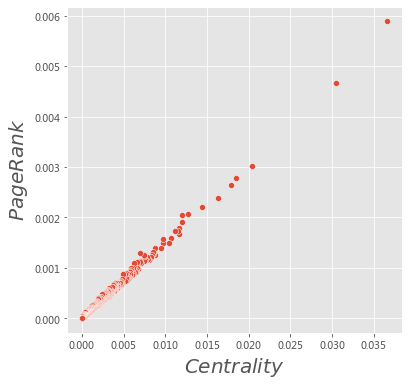

In [109]:
plt.figure(figsize = (6, 6))    

plt.style.use('ggplot')
sns.scatterplot(data=dd, x="Centrality", y="PageRank")

plt.xlabel('$Centrality$', fontsize = 20)
plt.ylabel('$PageRank$', fontsize = 20)

plt.show()

In [75]:
from collections import defaultdict
import numpy as np

def plotDegreeDistribution(G):
    degs = defaultdict(int)
    for i in dict(G.degree()).values(): degs[i]+=1
    items = sorted ( degs.items () )
    x, y = np.array(items).T
    y_sum = np.sum(y)
    y = [float(i)/y_sum for i in y]
    plt.plot(x, y, 'bo')
    plt.xscale('log')
    plt.yscale('log')
    #plt.legend(['Degree'])
    plt.xlabel('$K$', fontsize = 20)
    plt.ylabel('$P(K)$', fontsize = 20)
    plt.title('$Degree\,Distribution$', fontsize = 20)
    plt.show()   

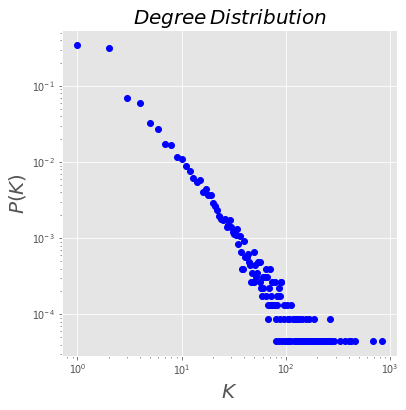

In [110]:
plt.style.use('ggplot')


plt.figure(figsize = (6, 6))    

plotDegreeDistribution(G)

In [115]:
G.remove_edges_from(nx.selfloop_edges(G))

In [120]:
g = nx.k_core(G,k=16)
nx.info(g)

'Name: \nType: Graph\nNumber of nodes: 199\nNumber of edges: 2766\nAverage degree:  27.7990'

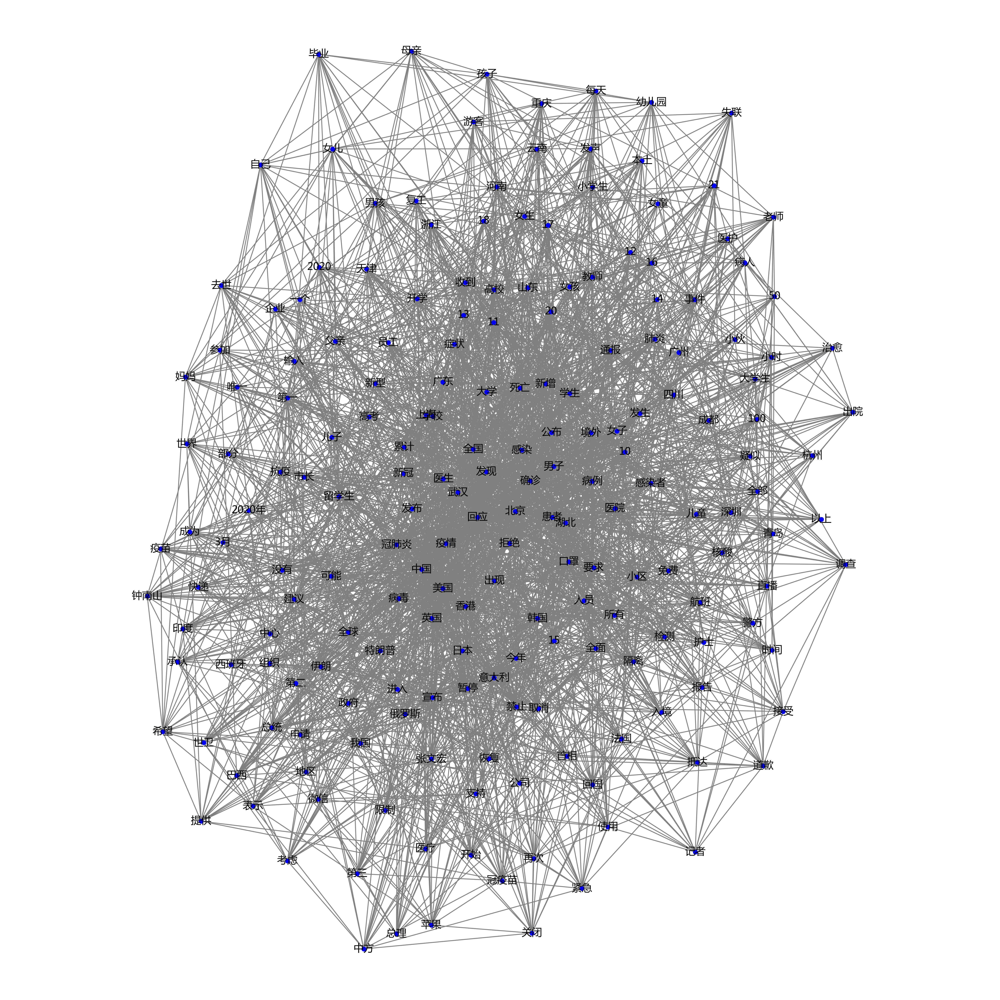

In [121]:
plt.rcParams['font.sans-serif'] = ['Microsoft YaHei']  # 用来正常显示中文标签
plt.rcParams['axes.unicode_minus'] = False  # 用来正常显示负号, 注意['SimHei']对应这句不行.

plt.figure(figsize = (16, 16), dpi = 300)    

nx.draw(g, with_labels = True, edge_color="grey", node_color='blue', rotate = True, node_size = 26)
plt.margins(x=0.2)